In [30]:
# import scenario properties from pickle
import pickle

with open('scenario-properties-baseline.pkl', 'rb') as f:
    scen_properties = pickle.load(f)

In [25]:
import os
# import x0 file from pyssem/utils/launch/data
path = os.path.join('pyssem', 'utils', 'launch', 'data', 'x0_elliptical.csv')
path_x0 = os.path.join('pyssem', 'utils', 'launch', 'data', 'x0.csv')

import pandas as pd
df = pd.read_csv(path)
x0 = pd.read_csv(path_x0)


In [20]:
print(df.columns)

Index(['B'], dtype='object')


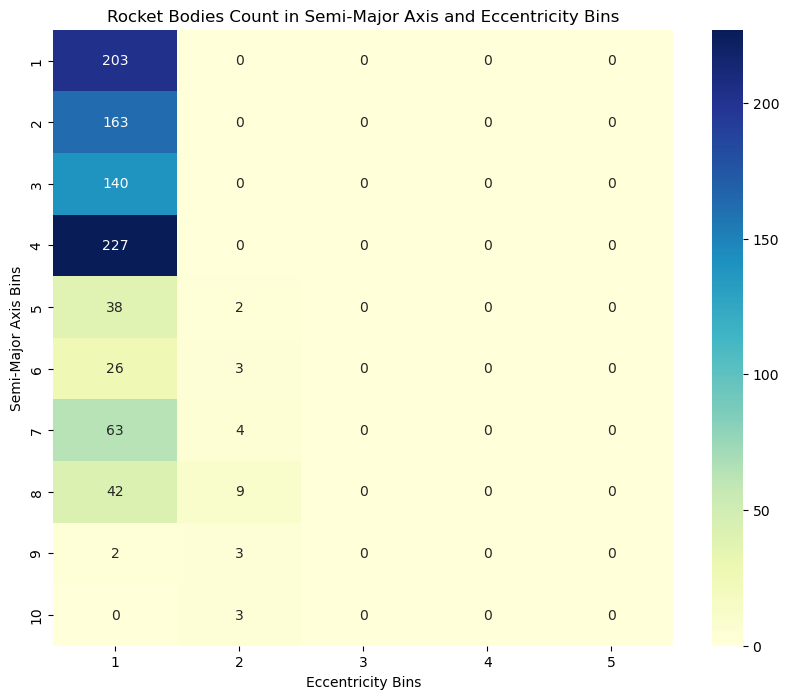

In [24]:
eccentricity_bins = [0.0, 0.1, 0.2, 0.3, 0.5, 0.9]
semi_major_axis_bins = [scenario_properties.re + alt for alt in scenario_properties.R0_km]
n_a_bins = len(semi_major_axis_bins) - 1
n_e_bins = len(eccentricity_bins) - 1
n_e_bins = 5  # Replace this with your actual number of eccentricity bins
n_a_bins = len(df) // n_e_bins

# Reshape the data into a matrix
matrix = df.values.reshape((n_a_bins, n_e_bins))

import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns
# Plot the heatmap
plt.figure(figsize=(10, 8))
sns.heatmap(matrix, annot=True, fmt="d", cmap="YlGnBu", xticklabels=np.arange(1, n_e_bins + 1), yticklabels=np.arange(1, n_a_bins + 1))
plt.xlabel('Eccentricity Bins')
plt.ylabel('Semi-Major Axis Bins')
plt.title('Rocket Bodies Count in Semi-Major Axis and Eccentricity Bins')
plt.show()

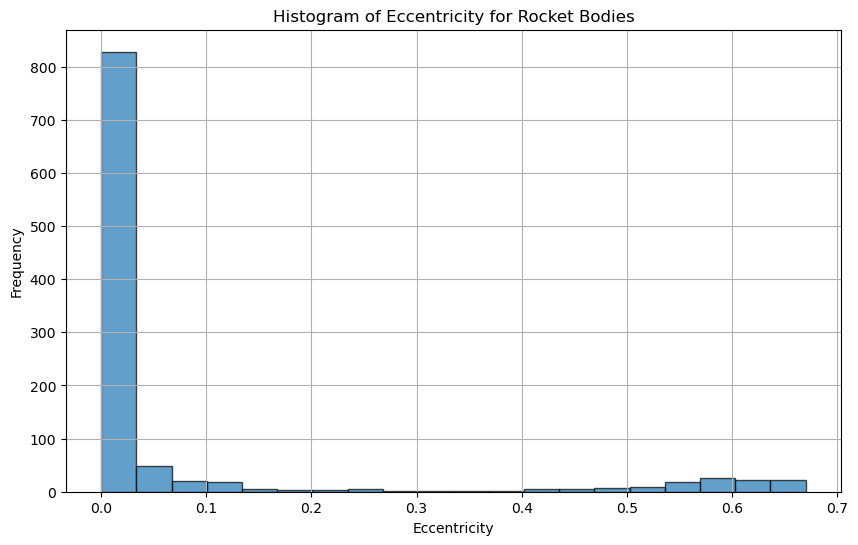

In [27]:
rocket_body_data = x0[x0['species_class'] == 'B']

# Create the histogram for eccentricity
plt.figure(figsize=(10, 6))
plt.hist(rocket_body_data['ecc'], bins=20, edgecolor='black', alpha=0.7)
plt.xlabel('Eccentricity')
plt.ylabel('Frequency')
plt.title('Histogram of Eccentricity for Rocket Bodies')
plt.grid(True)
plt.show()

Filtered Rocket Body Data:
           sma       ecc
2057  8315.964  0.166247
2058  8815.994  0.202761
2059  7128.259  0.022895
2060  7970.132  0.011404
2061  7439.333  0.018902


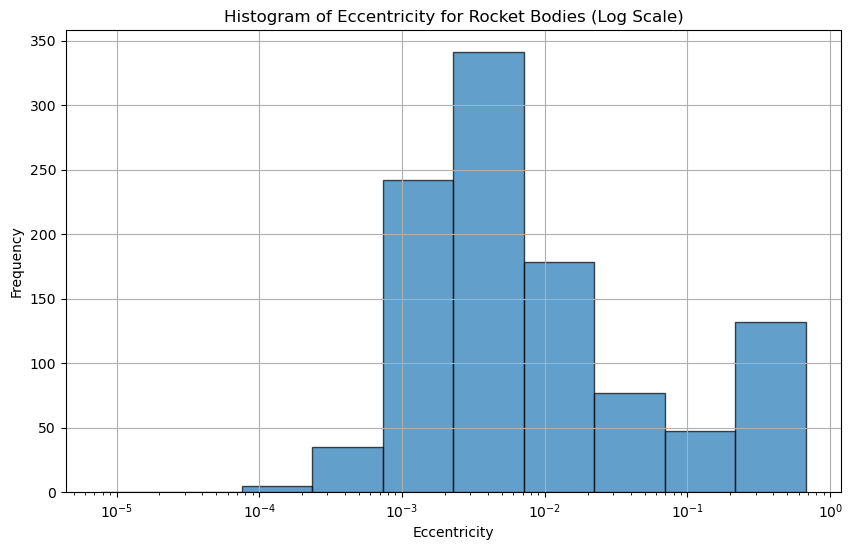

C:\Users\IT\AppData\Local\Temp\ipykernel_11748\388718373.py:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  rocket_body_data['a_bin'] = rocket_body_data['sma'].apply(lambda sma: find_bin_index(semi_major_axis_bins, sma))
C:\Users\IT\AppData\Local\Temp\ipykernel_11748\388718373.py:48: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  rocket_body_data['e_bin'] = rocket_body_data['ecc'].apply(lambda ecc: find_bin_index(eccentricity_bins, ecc))


Binned Rocket Body Data:
           sma       ecc  a_bin  e_bin
2057  8315.964  0.166247      4      8
2058  8815.994  0.202761      5      8
2059  7128.259  0.022895      1      7
2060  7970.132  0.011404      3      6
2061  7439.333  0.018902      2      6
Eccentricity bins: [7.80010000e-06 2.43049196e-05 7.57335314e-05 2.35983820e-04
 7.35319776e-04 2.29123833e-03 7.13944223e-03 2.22463263e-02
 6.93190053e-02 2.15996314e-01 6.73039200e-01]
Semi-major axis bins: [ 6590.633       6972.02276975  7375.48297741  7802.29080521
  8253.79734392  8731.43186985  9236.70636934  9771.22032505
 10336.66577922 10934.83268997 11567.61459754 12237.01461843
 12945.1517864  13694.26776042 14486.7339208  15325.058876
 16211.89640376 17150.05385186 18142.50102495 19192.37958571
 20303.013     ]
Rocket Body Eccentricity Range: 0.0001551 0.6697685
Rocket Body Semi-major Axis Range: 6656.001 20207.459
Rocket Body Matrix:
    0  1  2   3    4    5   6   7   8   9
0   0  0  2   8   35   50  36   7   0   0
1

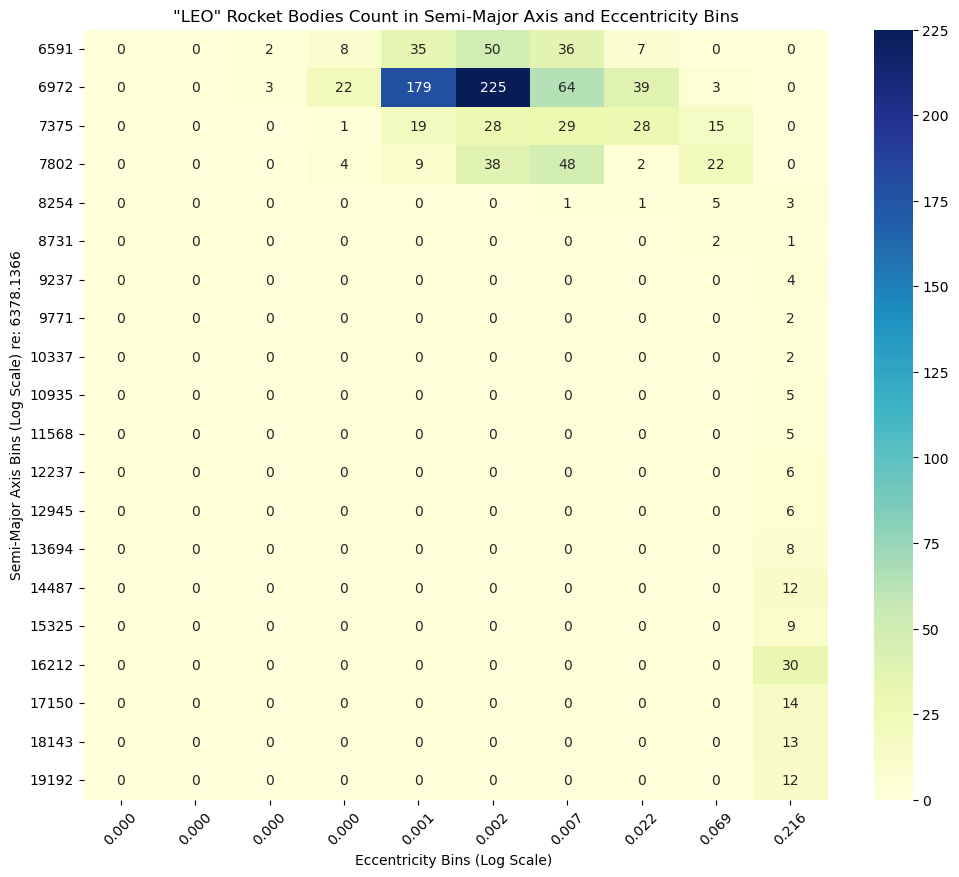

In [41]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

# Assuming x0 is your DataFrame
# x0 = pd.read_csv('path_to_your_csv_file.csv')  # Uncomment this line if you need to load the DataFrame from a CSV file

# Define the non-linear bins
semi_major_axis_min = x0['sma'].min()
semi_major_axis_max = x0['sma'].max()
eccentricity_min = x0['ecc'].min()
eccentricity_max = x0['ecc'].max()

# Create non-linear spreads of bins using a logarithmic scale
semi_major_axis_bins = np.logspace(np.log10(semi_major_axis_min), np.log10(semi_major_axis_max), num=21)
eccentricity_bins = np.logspace(np.log10(eccentricity_min + 1e-10), np.log10(eccentricity_max), num=11)  # Adding a small value to avoid log(0)

n_a_bins = len(semi_major_axis_bins) - 1
n_e_bins = len(eccentricity_bins) - 1

# Filter the DataFrame for species_class 'B'
rocket_body_data = x0[x0['species_class'] == 'B']

# Debug: Check filtered data
print("Filtered Rocket Body Data:")
print(rocket_body_data[['sma', 'ecc']].head())

# Create the histogram for eccentricity with non-linear bins
plt.figure(figsize=(10, 6))
plt.hist(rocket_body_data['ecc'], bins=eccentricity_bins, edgecolor='black', alpha=0.7)
plt.xscale('log')
plt.xlabel('Eccentricity')
plt.ylabel('Frequency')
plt.title('Histogram of Eccentricity for Rocket Bodies (Log Scale)')
plt.grid(True)
plt.show()

def find_bin_index(bin_edges, value):
    """Find the index of the bin a value belongs to."""
    for i in range(len(bin_edges) - 1):
        if bin_edges[i] <= value < bin_edges[i + 1]:
            return i
    return len(bin_edges) - 2 if value == bin_edges[-1] else -1  # Handle edge case

# Bin the data
rocket_body_data['a_bin'] = rocket_body_data['sma'].apply(lambda sma: find_bin_index(semi_major_axis_bins, sma))
rocket_body_data['e_bin'] = rocket_body_data['ecc'].apply(lambda ecc: find_bin_index(eccentricity_bins, ecc))

# Debug: Check binned data
print("Binned Rocket Body Data:")
print(rocket_body_data[['sma', 'ecc', 'a_bin', 'e_bin']].head())

# Additional debug to check the range of values
print("Eccentricity bins:", eccentricity_bins)
print("Semi-major axis bins:", semi_major_axis_bins)
print("Rocket Body Eccentricity Range:", rocket_body_data['ecc'].min(), rocket_body_data['ecc'].max())
print("Rocket Body Semi-major Axis Range:", rocket_body_data['sma'].min(), rocket_body_data['sma'].max())

# Initialize the matrix with zeroes
rocket_body_matrix = pd.DataFrame(0, index=range(n_a_bins), columns=range(n_e_bins))

# Populate the matrix
for idx, row in rocket_body_data.iterrows():
    a_idx = row['a_bin']
    e_idx = row['e_bin']
    if a_idx != -1 and e_idx != -1:
        rocket_body_matrix.at[a_idx, e_idx] += 1

# Debug: Check the populated matrix
print("Rocket Body Matrix:")
print(rocket_body_matrix)

# Plot the heatmap
plt.figure(figsize=(12, 10))
sns.heatmap(rocket_body_matrix, annot=True, fmt="d", cmap="YlGnBu", 
            xticklabels=[f"{ecc:.3f}" for ecc in eccentricity_bins[:-1]], 
            yticklabels=[f"{sma:.0f}" for sma in semi_major_axis_bins[:-1]])
plt.xlabel(f'Eccentricity Bins (Log Scale) ')
plt.ylabel(f'Semi-Major Axis Bins (Log Scale) re: {scen_properties.re}')
plt.title('"LEO" Rocket Bodies Count in Semi-Major Axis and Eccentricity Bins')
plt.xticks(rotation=45)
plt.show()

# Eliptical Orbits propagation

In [47]:
import numpy as np

def analytic_prop_vec_MOD(input_oe, param):
    """
    Compute the osculating orbital elements based on input mean orbital elements and parameters.

    Args:
        input_oe (np.ndarray): Input mean orbital elements [a, e, i, RA, w, Mo].
        param (dict): Dictionary of parameters including 'req', 'j2', 'mu', 'Bstar', 'rho', 't', and 't_0'.

    Returns:
        np.ndarray: Osculating orbital elements.
        np.ndarray: Error indicators (1 if error, 0 if no error).
    """
    re = param['req']
    J2 = param['j2']
    mu = param['mu']
    rho_0 = param['rho']
    Bstar = param['Bstar']
    t = param['t']
    t_0 = param['t_0']

    a_0 = input_oe[:, 0]
    a_minus_re = a_0 - re

    # Compute density and drag coefficient
    C_0 = np.maximum(0.5 * Bstar * rho_0, 1e-20)
    k2_over_mu = J2 * re ** 2 / 2

    # Initial conditions
    e_0 = input_oe[:, 1]
    inc_0 = input_oe[:, 2]
    bigO_0 = input_oe[:, 3]
    omega_0 = input_oe[:, 4]
    Mo_0 = input_oe[:, 5]

    c = np.cos(inc_0)
    c_sq = c ** 2

    n_0 = np.sqrt(mu) * a_0 ** (-3/2)
    alpha0_sq = (e_0 / np.sqrt(a_0)) ** 2
    beta_0 = (np.sqrt(3) / 2) * e_0

    tan_atan_beta0 = np.maximum(np.tan(np.arctan(beta_0) - beta_0 * n_0 * a_0 * C_0 * (t - t_0)), 0)
    a = (a_0 / beta_0 ** 2) * tan_atan_beta0 ** 2
    e = (2 / np.sqrt(3)) * tan_atan_beta0

    check_beta = beta_0 == 0
    if np.any(check_beta):
        a0_beta = a_0[check_beta]
        a[check_beta] = a0_beta * (1 - C_0[check_beta] * n_0[check_beta] * a0_beta * (t - t_0))

    # Compute variables to avoid repetition
    a_sq = a ** 2
    four_thirds_over_a_cb = 4 / 3 / (a_sq * a)
    a0_sq = a_0 ** 2
    four_thirds_over_a0_cb = 4 / 3 / (a0_sq * a_0)
    alpha0sq_over_asq = alpha0_sq / a_sq
    alpha0sq_over_a0sq = alpha0_sq / a0_sq

    Mo = (0.5 / a - 0.5 / a_0 + 3 / 8 * alpha0_sq * np.log(a / a_0)) / C_0 + \
         3 * k2_over_mu / 16 * (3 * c_sq - 1) * \
         (1.5 * (alpha0sq_over_asq - alpha0sq_over_a0sq) + four_thirds_over_a_cb - four_thirds_over_a0_cb) / C_0 + Mo_0

    five_a0sq_over2_tau2_plus_4thirds_over_tau3_over_C0 = \
        (2.5 * (alpha0sq_over_asq - alpha0sq_over_a0sq) + four_thirds_over_a_cb - four_thirds_over_a0_cb) / C_0

    omega = 3 * k2_over_mu / 16 * (5 * c_sq - 1) * five_a0sq_over2_tau2_plus_4thirds_over_tau3_over_C0 + omega_0
    bigO = -3 * k2_over_mu / 8 * c * five_a0sq_over2_tau2_plus_4thirds_over_tau3_over_C0 + bigO_0

    out_oe = np.column_stack([a, e, np.mod(inc_0, 2 * np.pi), np.mod(bigO, 2 * np.pi), np.mod(omega, 2 * np.pi), np.mod(Mo, 2 * np.pi)])
    
    errors = np.zeros(len(input_oe))
    not_real = ~np.isreal(inc_0) | ~np.isreal(bigO) | ~np.isreal(omega) | ~np.isreal(Mo)
    errors[not_real] = 1
    out_oe[not_real] = input_oe[not_real]

    return out_oe, errors

In [48]:
# Define parameters and initial conditions
param = {
    'req': 6378.136,  # Earth's radius in km
    'j2': 1.08263e-3,  # J2 perturbation term
    'mu': 398600,  # Gravitational parameter in km^3/s^2
    'rho': 1e-12,  # Example density in kg/km^3
    'Bstar': 2e-4,  # Example Bstar value
    't': 3600 * 24,  # Final time (e.g., 24 hours)
    't_0': 0  # Initial time
}

# Initial orbital elements [a, e, i, RA, w, Mo]
input_oe = np.array([
    [7000, 0.01, np.deg2rad(30), np.deg2rad(40), np.deg2rad(60), np.deg2rad(0)]
])

# Call the propagation function
out_oe, errors = analytic_prop_vec_MOD(input_oe, param)

# Print the updated orbital elements
print("Updated Orbital Elements:")
print(out_oe)
print("Errors:")
print(errors)

Updated Orbital Elements:
[[7.00000000e+03 1.00000000e-02 5.23598776e-01 5.89360247e-01
  1.21989543e+00 5.25356948e+00]]
Errors:
[0.]


In [56]:
def propagate_orbits(population, param, time_step):
    new_population = np.zeros_like(population)
    for i, a in enumerate(semi_major_axis_midpoints):
        for j, e in enumerate(eccentricity_midpoints):
            input_oe = np.array([[a, e, np.deg2rad(30), np.deg2rad(40), np.deg2rad(60), np.deg2rad(0)]])
            param['t'] = param['t_0'] + time_step
            out_oe, errors = analytic_prop_vec_MOD(input_oe, param)
            if not errors[0]:
                new_a = out_oe[0, 0]
                new_e = out_oe[0, 1]
                a_bin = np.digitize(new_a, semi_major_axis_bins) - 1
                e_bin = np.digitize(new_e, eccentricity_bins) - 1
                if 0 <= a_bin < n_a_bins and 0 <= e_bin < n_e_bins:
                    new_population[a_bin, e_bin] += population[i, j]
    return new_population

Filtered Rocket Body Data:
           sma       ecc
2057  8315.964  0.166247
2058  8815.994  0.202761
2059  7128.259  0.022895
2060  7970.132  0.011404
2061  7439.333  0.018902


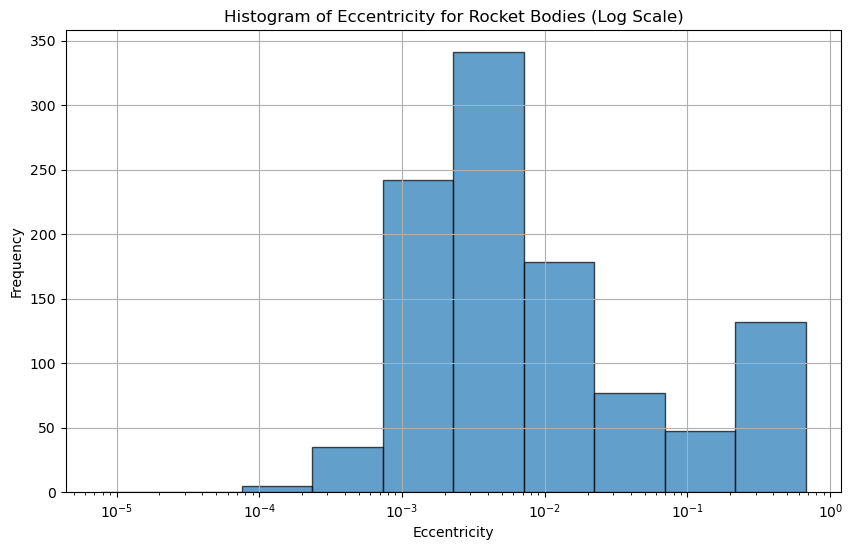

C:\Users\IT\AppData\Local\Temp\ipykernel_11748\729172439.py:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  rocket_body_data['a_bin'] = rocket_body_data['sma'].apply(lambda sma: find_bin_index(semi_major_axis_bins, sma))
C:\Users\IT\AppData\Local\Temp\ipykernel_11748\729172439.py:48: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  rocket_body_data['e_bin'] = rocket_body_data['ecc'].apply(lambda ecc: find_bin_index(eccentricity_bins, ecc))


Binned Rocket Body Data:
           sma       ecc  a_bin  e_bin
2057  8315.964  0.166247      4      8
2058  8815.994  0.202761      5      8
2059  7128.259  0.022895      1      7
2060  7970.132  0.011404      3      6
2061  7439.333  0.018902      2      6
Eccentricity bins: [7.80010000e-06 2.43049196e-05 7.57335314e-05 2.35983820e-04
 7.35319776e-04 2.29123833e-03 7.13944223e-03 2.22463263e-02
 6.93190053e-02 2.15996314e-01 6.73039200e-01]
Semi-major axis bins: [ 6590.633       6972.02276975  7375.48297741  7802.29080521
  8253.79734392  8731.43186985  9236.70636934  9771.22032505
 10336.66577922 10934.83268997 11567.61459754 12237.01461843
 12945.1517864  13694.26776042 14486.7339208  15325.058876
 16211.89640376 17150.05385186 18142.50102495 19192.37958571
 20303.013     ]
Rocket Body Eccentricity Range: 0.0001551 0.6697685
Rocket Body Semi-major Axis Range: 6656.001 20207.459
Rocket Body Matrix:
    0  1  2   3    4    5   6   7   8   9
0   0  0  2   8   35   50  36   7   0   0
1

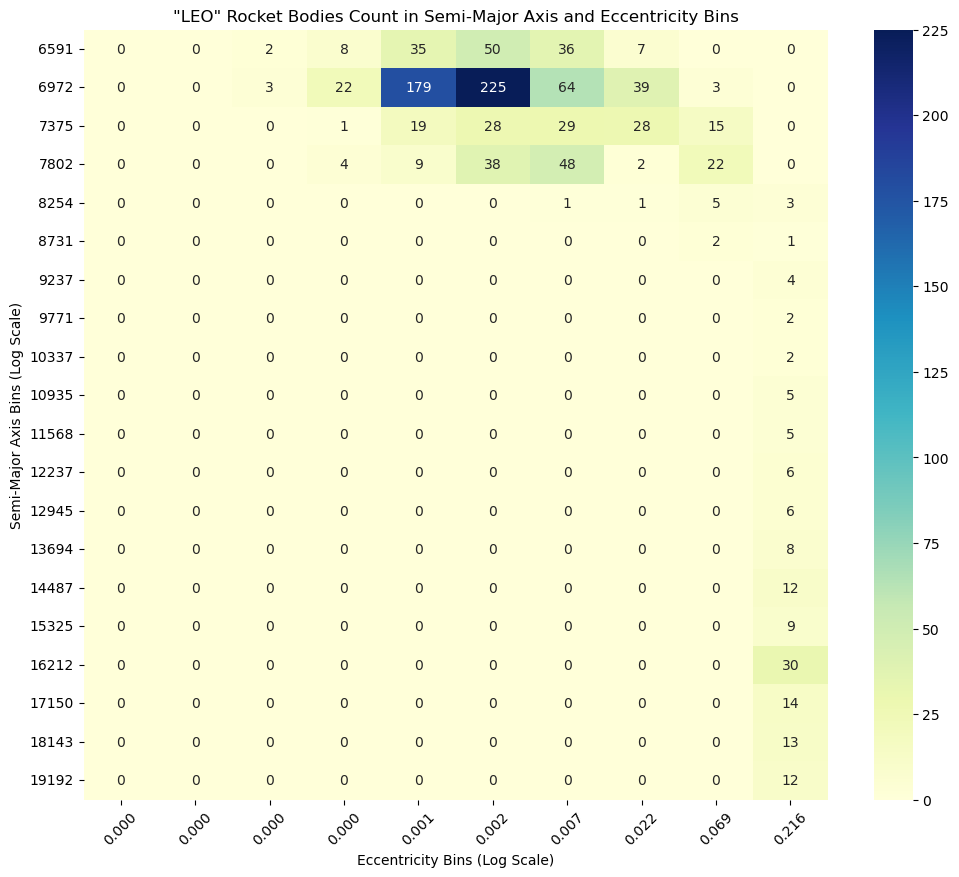

Moved 2.0 objects from bin (0, 2) to (0, 1)
Original (a, e): (6781.33, 0.00016), New (a, e): (6781.33, 0.00016)
Moved 8.0 objects from bin (0, 3) to (0, 2)
Original (a, e): (6781.33, 0.00049), New (a, e): (6781.33, 0.00049)
Moved 35.0 objects from bin (0, 4) to (0, 3)
Original (a, e): (6781.33, 0.00151), New (a, e): (6781.33, 0.00151)
Moved 50.0 objects from bin (0, 5) to (0, 4)
Original (a, e): (6781.33, 0.00472), New (a, e): (6781.33, 0.00472)
Moved 36.0 objects from bin (0, 6) to (0, 5)
Original (a, e): (6781.33, 0.01469), New (a, e): (6781.33, 0.01469)
Moved 7.0 objects from bin (0, 7) to (0, 6)
Original (a, e): (6781.33, 0.04578), New (a, e): (6781.33, 0.04578)
Moved 3.0 objects from bin (1, 2) to (0, 1)
Original (a, e): (7173.75, 0.00016), New (a, e): (7173.75, 0.00016)
Moved 22.0 objects from bin (1, 3) to (0, 2)
Original (a, e): (7173.75, 0.00049), New (a, e): (7173.75, 0.00049)
Moved 179.0 objects from bin (1, 4) to (0, 3)
Original (a, e): (7173.75, 0.00151), New (a, e): (7173

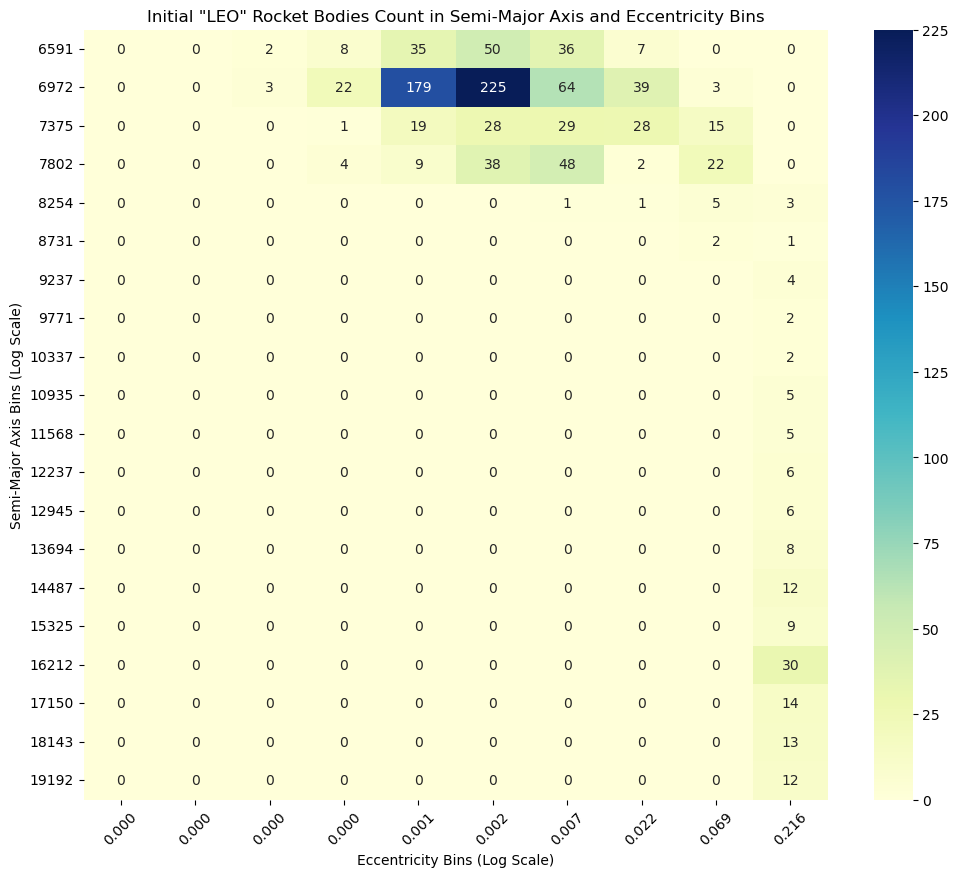

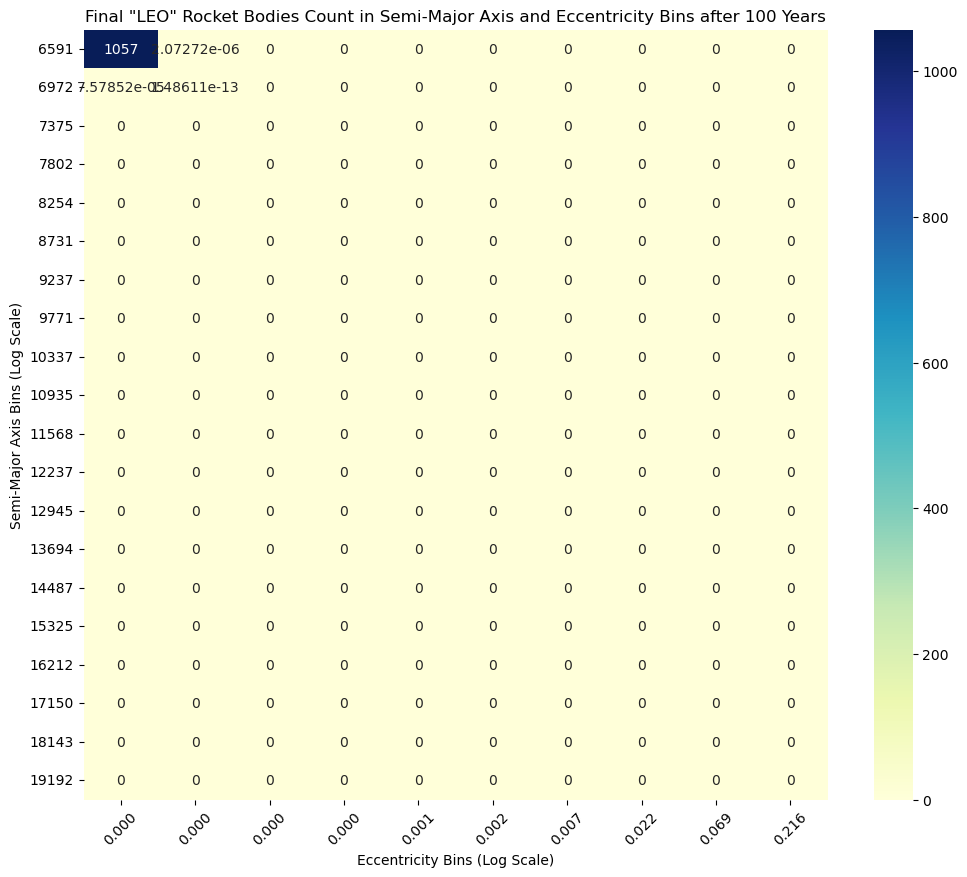

In [73]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

# Assuming x0 is your DataFrame
# x0 = pd.read_csv('path_to_your_csv_file.csv')  # Uncomment this line if you need to load the DataFrame from a CSV file

# Define the non-linear bins
semi_major_axis_min = x0['sma'].min()
semi_major_axis_max = x0['sma'].max()
eccentricity_min = x0['ecc'].min()
eccentricity_max = x0['ecc'].max()

# Create non-linear spreads of bins using a logarithmic scale
semi_major_axis_bins = np.logspace(np.log10(semi_major_axis_min), np.log10(semi_major_axis_max), num=21)
eccentricity_bins = np.logspace(np.log10(eccentricity_min + 1e-10), np.log10(eccentricity_max), num=11)  # Adding a small value to avoid log(0)

n_a_bins = len(semi_major_axis_bins) - 1
n_e_bins = len(eccentricity_bins) - 1

# Filter the DataFrame for species_class 'B'
rocket_body_data = x0[x0['species_class'] == 'B']

# Debug: Check filtered data
print("Filtered Rocket Body Data:")
print(rocket_body_data[['sma', 'ecc']].head())

# Create the histogram for eccentricity with non-linear bins
plt.figure(figsize=(10, 6))
plt.hist(rocket_body_data['ecc'], bins=eccentricity_bins, edgecolor='black', alpha=0.7)
plt.xscale('log')
plt.xlabel('Eccentricity')
plt.ylabel('Frequency')
plt.title('Histogram of Eccentricity for Rocket Bodies (Log Scale)')
plt.grid(True)
plt.show()

def find_bin_index(bin_edges, value):
    """Find the index of the bin a value belongs to."""
    for i in range(len(bin_edges) - 1):
        if bin_edges[i] <= value < bin_edges[i + 1]:
            return i
    return len(bin_edges) - 2 if value == bin_edges[-1] else -1  # Handle edge case

# Bin the data
rocket_body_data['a_bin'] = rocket_body_data['sma'].apply(lambda sma: find_bin_index(semi_major_axis_bins, sma))
rocket_body_data['e_bin'] = rocket_body_data['ecc'].apply(lambda ecc: find_bin_index(eccentricity_bins, ecc))

# Debug: Check binned data
print("Binned Rocket Body Data:")
print(rocket_body_data[['sma', 'ecc', 'a_bin', 'e_bin']].head())

# Additional debug to check the range of values
print("Eccentricity bins:", eccentricity_bins)
print("Semi-major axis bins:", semi_major_axis_bins)
print("Rocket Body Eccentricity Range:", rocket_body_data['ecc'].min(), rocket_body_data['ecc'].max())
print("Rocket Body Semi-major Axis Range:", rocket_body_data['sma'].min(), rocket_body_data['sma'].max())

# Initialize the matrix with zeroes
rocket_body_matrix = pd.DataFrame(0, index=range(n_a_bins), columns=range(n_e_bins))

# Populate the matrix
for idx, row in rocket_body_data.iterrows():
    a_idx = row['a_bin']
    e_idx = row['e_bin']
    if a_idx != -1 and e_idx != -1:
        rocket_body_matrix.at[a_idx, e_idx] += 1

# Debug: Check the populated matrix
print("Rocket Body Matrix:")
print(rocket_body_matrix)

# Plot the heatmap
plt.figure(figsize=(12, 10))
sns.heatmap(rocket_body_matrix, annot=True, fmt="g", cmap="YlGnBu", 
            xticklabels=[f"{ecc:.3f}" for ecc in eccentricity_bins[:-1]], 
            yticklabels=[f"{sma:.0f}" for sma in semi_major_axis_bins[:-1]])
plt.xlabel('Eccentricity Bins (Log Scale)')
plt.ylabel('Semi-Major Axis Bins (Log Scale)')
plt.title('"LEO" Rocket Bodies Count in Semi-Major Axis and Eccentricity Bins')
plt.xticks(rotation=45)
plt.show()

# Propagation function
def propagate_orbits(population, param, time_step):
    new_population = np.zeros_like(population)
    for i, a in enumerate(semi_major_axis_midpoints):
        for j, e in enumerate(eccentricity_midpoints):
            if population[i, j] > 0:
                input_oe = np.array([[a, e, np.deg2rad(30), np.deg2rad(40), np.deg2rad(60), np.deg2rad(0)]])
                param['t'] = param['t_0'] + time_step
                out_oe, errors = analytic_prop_vec_MOD(input_oe, param)
                if not errors[0]:
                    new_a = out_oe[0, 0]
                    new_e = out_oe[0, 1]
                    
                    # Calculate fractional movement
                    a_fraction = (new_a - a) / (semi_major_axis_bins[1] - semi_major_axis_bins[0])
                    e_fraction = (new_e - e) / (eccentricity_bins[1] - eccentricity_bins[0])
                    
                    a_bin = np.digitize(new_a, semi_major_axis_bins) - 1
                    e_bin = np.digitize(new_e, eccentricity_bins) - 1
                    
                    # Ensure at least some movement to neighboring bins
                    if a_bin == i and e_bin == j:
                        a_bin = i + 1 if new_a > a else i - 1
                        e_bin = j + 1 if new_e > e else j - 1

                    a_bin = np.clip(a_bin, 0, n_a_bins - 1)
                    e_bin = np.clip(e_bin, 0, n_e_bins - 1)

                    # Calculate the fraction of objects moving to each bin
                    if 0 <= a_bin < n_a_bins and 0 <= e_bin < n_e_bins:
                        new_population[a_bin, e_bin] += population[i, j] * (1 - abs(a_fraction)) * (1 - abs(e_fraction))
                    if 0 <= a_bin + 1 < n_a_bins and 0 <= e_bin < n_e_bins:
                        new_population[a_bin + 1, e_bin] += population[i, j] * abs(a_fraction) * (1 - abs(e_fraction))
                    if 0 <= a_bin < n_a_bins and 0 <= e_bin + 1 < n_e_bins:
                        new_population[a_bin, e_bin + 1] += population[i, j] * (1 - abs(a_fraction)) * abs(e_fraction)
                    if 0 <= a_bin + 1 < n_a_bins and 0 <= e_bin + 1 < n_e_bins:
                        new_population[a_bin + 1, e_bin + 1] += population[i, j] * abs(a_fraction) * abs(e_fraction)
                    
                    print(f"Moved {population[i, j]} objects from bin ({i}, {j}) to ({a_bin}, {e_bin})")
                    print(f"Original (a, e): ({a:.2f}, {e:.5f}), New (a, e): ({new_a:.2f}, {new_e:.5f})")
    return new_population

# Parameters
param = {
    'req': 6378.136,  # Earth's radius in km
    'j2': 1.08263e-3,  # J2 perturbation term
    'mu': 398600,  # Gravitational parameter in km^3/s^2
    'rho': 1e-12,  # Example density in kg/km^3
    'Bstar': 2e-4,  # Example Bstar value
    't_0': 0  # Initial time
}

# Time span
years = 10
days_per_year = 365.25
time_steps_per_year = 12  # Monthly time steps
total_time_steps = int(years * time_steps_per_year)
time_step = days_per_year / time_steps_per_year * 24 * 3600  # seconds

# Calculate midpoints for bins
semi_major_axis_midpoints = (semi_major_axis_bins[:-1] + semi_major_axis_bins[1:]) / 2
eccentricity_midpoints = (eccentricity_bins[:-1] + eccentricity_bins[1:]) / 2

# Initialize population matrix based on initial data distribution
population = np.zeros((n_a_bins, n_e_bins))
for idx, row in rocket_body_data.iterrows():
    a_bin = np.digitize(row['sma'], semi_major_axis_bins) - 1
    e_bin = np.digitize(row['ecc'], eccentricity_bins) - 1
    population[a_bin, e_bin] += 1

# Save initial population for comparison
initial_population = population.copy()

# Propagate orbits over time
for t in range(total_time_steps):
    population = propagate_orbits(population, param, time_step)
    print(f"Time step {t + 1}/{total_time_steps}")

# Plot the heatmap of initial population
plt.figure(figsize=(12, 10))
sns.heatmap(initial_population, annot=True, fmt="g", cmap="YlGnBu", 
            xticklabels=[f"{ecc:.3f}" for ecc in eccentricity_bins[:-1]], 
            yticklabels=[f"{sma:.0f}" for sma in semi_major_axis_bins[:-1]])
plt.xlabel('Eccentricity Bins (Log Scale)')
plt.ylabel('Semi-Major Axis Bins (Log Scale)')
plt.title('Initial "LEO" Rocket Bodies Count in Semi-Major Axis and Eccentricity Bins')
plt.xticks(rotation=45)
plt.show()

# Plot the heatmap of final population
plt.figure(figsize=(12, 10))
sns.heatmap(population, annot=True, fmt="g", cmap="YlGnBu", 
            xticklabels=[f"{ecc:.3f}" for ecc in eccentricity_bins[:-1]], 
            yticklabels=[f"{sma:.0f}" for sma in semi_major_axis_bins[:-1]])
plt.xlabel('Eccentricity Bins (Log Scale)')
plt.ylabel('Semi-Major Axis Bins (Log Scale)')
plt.title('Final "LEO" Rocket Bodies Count in Semi-Major Axis and Eccentricity Bins after 100 Years')
plt.xticks(rotation=45)
plt.show()

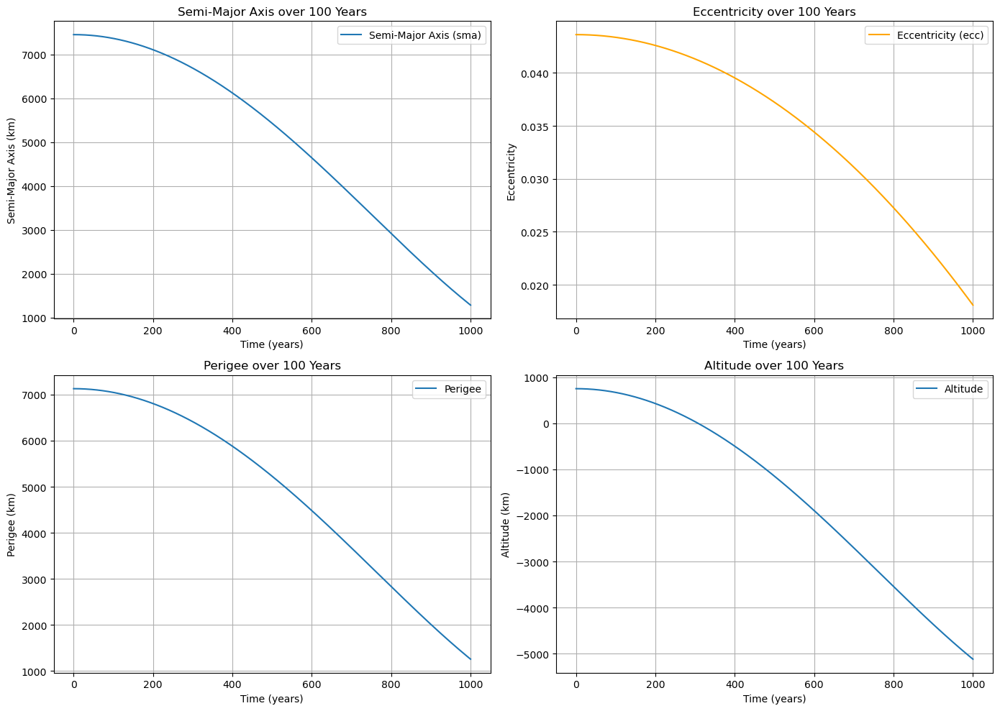

In [69]:
import numpy as np
import matplotlib.pyplot as plt

# Constants
mu = 398600  # Gravitational parameter (km^3/s^2)
RE = 6378  # Earth’s radius (km)
J2 = 1082.63e-6  # Earth’s J2
hours = 3600  # Hours to seconds
days = 24 * hours  # Days to seconds
months = 30 * days
years = 12 * months
deg = np.pi / 180  # Degrees to radians

# Initial conditions
rp0 = RE + 750  # perigee radius (km)
ra0 = RE + 1400  # apogee radius (km)
nout = 7 * days
tf = 1000 * 12 * 30 * days

e0 = (ra0 - rp0) / (ra0 + rp0)  # eccentricity
h0 = np.sqrt(rp0 * mu * (1 + e0))  # angular momentum (km^2/s)
a0 = (rp0 + ra0) / 2  # Semi-major axis (km)
T0 = 2 * np.pi / np.sqrt(mu) * a0 ** 1.5  # Period (s)
coe0 = [h0, e0, 0, 0, 0, 0]  # Initial orbital elements
t0 = 0

# Parameters for the analytical propagator
param = {
    'req': RE,  # Earth's radius in km
    'j2': J2,  # J2 perturbation term
    'mu': mu,  # Gravitational parameter in km^3/s^2
    'rho': 1e-12,  # Example density in kg/km^3
    'Bstar': 2e-4,  # Example Bstar value
    't_0': 0  # Initial time
}

# Time span
time_steps = int(tf / nout)
time_step = nout

# Function to propagate and record the evolution of orbital elements
def propagate_orbit(initial_oe, time_steps, time_step, param):
    sma_over_time = [initial_oe[0, 0]]
    ecc_over_time = [initial_oe[0, 1]]
    perigee_over_time = [initial_oe[0, 0] * (1 - initial_oe[0, 1])]
    altitude_over_time = [(initial_oe[0, 0] * (1 - initial_oe[0, 1])) - RE]
    for t in range(time_steps):
        param['t'] = param['t_0'] + (t + 1) * time_step
        out_oe, errors = analytic_prop_vec_MOD(initial_oe, param)
        if not errors[0]:
            sma_over_time.append(out_oe[0, 0])
            ecc_over_time.append(out_oe[0, 1])
            perigee_over_time.append(out_oe[0, 0] * (1 - out_oe[0, 1]))
            altitude_over_time.append((out_oe[0, 0] * (1 - out_oe[0, 1])) - RE)
            initial_oe = out_oe  # Update the initial orbital elements for the next step
    return sma_over_time, ecc_over_time, perigee_over_time, altitude_over_time

# Initial orbital elements
initial_oe = np.array([[a0, e0, np.deg2rad(30), np.deg2rad(40), np.deg2rad(60), np.deg2rad(0)]])

# Propagate the orbit
sma_over_time, ecc_over_time, perigee_over_time, altitude_over_time = propagate_orbit(initial_oe, time_steps, time_step, param)

# Convert time to years for plotting
time_years = np.linspace(0, tf / years, time_steps + 1)

# Plot the results
plt.figure(figsize=(14, 10))

plt.subplot(2, 2, 1)
plt.plot(time_years, sma_over_time, label='Semi-Major Axis (sma)')
plt.xlabel('Time (years)')
plt.ylabel('Semi-Major Axis (km)')
plt.title('Semi-Major Axis over 100 Years')
plt.grid(True)
plt.legend()

plt.subplot(2, 2, 2)
plt.plot(time_years, ecc_over_time, label='Eccentricity (ecc)', color='orange')
plt.xlabel('Time (years)')
plt.ylabel('Eccentricity')
plt.title('Eccentricity over 100 Years')
plt.grid(True)
plt.legend()

plt.subplot(2, 2, 3)
plt.plot(time_years, perigee_over_time, label='Perigee')
plt.xlabel('Time (years)')
plt.ylabel('Perigee (km)')
plt.title('Perigee over 100 Years')
plt.grid(True)
plt.legend()

plt.subplot(2, 2, 4)
plt.plot(time_years, altitude_over_time, label='Altitude')
plt.xlabel('Time (years)')
plt.ylabel('Altitude (km)')
plt.title('Altitude over 100 Years')
plt.grid(True)
plt.legend()

plt.tight_layout()
plt.show()

Filtered Rocket Body Data:
           sma       ecc
2057  8315.964  0.166247
2058  8815.994  0.202761
2059  7128.259  0.022895
2060  7970.132  0.011404
2061  7439.333  0.018902


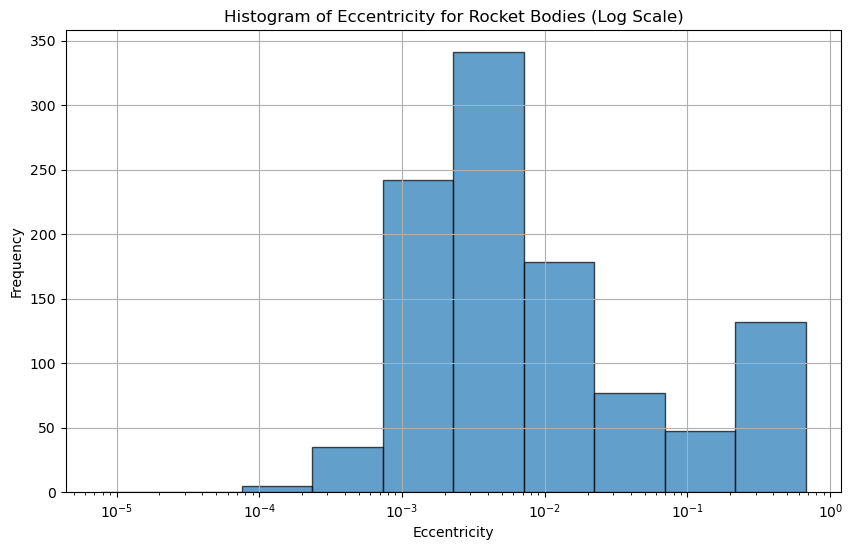

C:\Users\IT\AppData\Local\Temp\ipykernel_11748\1433229405.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  rocket_body_data['e_bin'] = rocket_body_data['ecc'].apply(lambda ecc: find_bin_index(eccentricity_bins, ecc))


Binned Rocket Body Data:
           ecc  e_bin
2057  0.166247      8
2058  0.202761      8
2059  0.022895      7
2060  0.011404      6
2061  0.018902      6
Eccentricity bins: [7.80010000e-06 2.43049196e-05 7.57335314e-05 2.35983820e-04
 7.35319776e-04 2.29123833e-03 7.13944223e-03 2.22463263e-02
 6.93190053e-02 2.15996314e-01 6.73039200e-01]
Rocket Body Eccentricity Range: 0.0001551 0.6697685
Rocket Body Matrix:
   Count
0      0
1      0
2      5
3     35
4    242
5    341
6    178
7     77
8     47
9    132


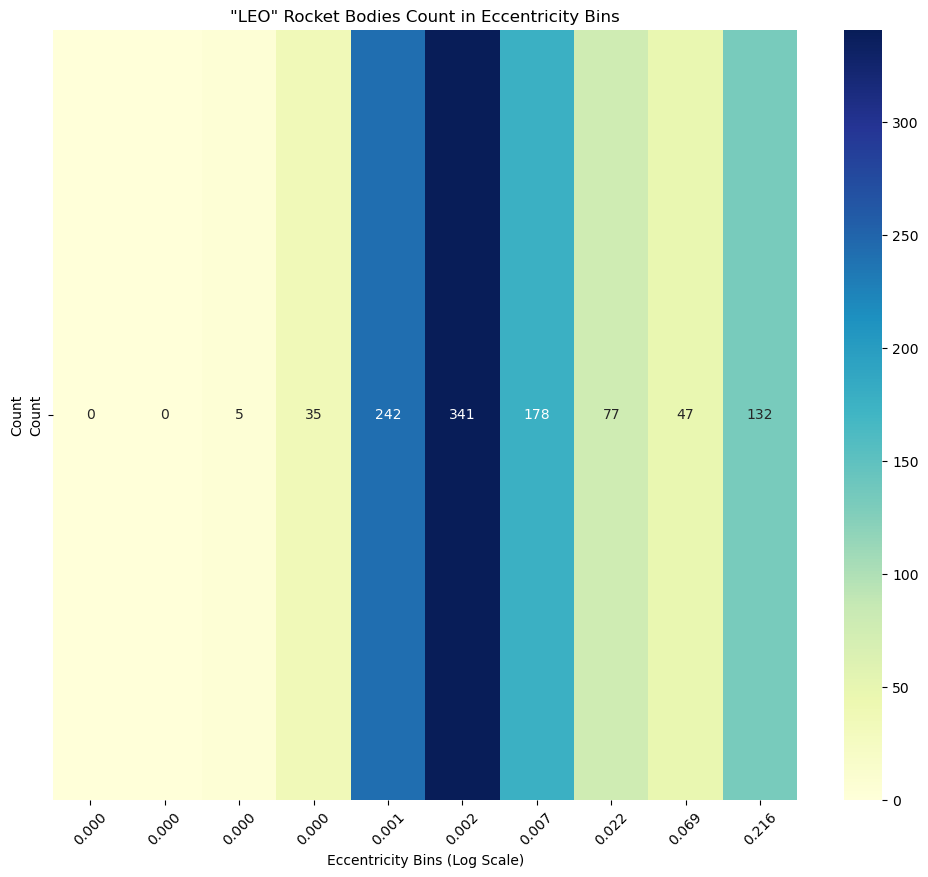

Moved 5.0 objects from bin (2) to (2)
Original e: 0.00016, New e: 0.00016, Fraction: -0.00000
Moved 35.0 objects from bin (3) to (3)
Original e: 0.00049, New e: 0.00049, Fraction: -0.00000
Moved 242.0 objects from bin (4) to (4)
Original e: 0.00151, New e: 0.00151, Fraction: -0.00000
Moved 341.0 objects from bin (5) to (5)
Original e: 0.00472, New e: 0.00472, Fraction: -0.00000
Moved 178.0 objects from bin (6) to (6)
Original e: 0.01469, New e: 0.01469, Fraction: -0.00000
Moved 77.0 objects from bin (7) to (7)
Original e: 0.04578, New e: 0.04578, Fraction: -0.00001
Moved 47.0 objects from bin (8) to (8)
Original e: 0.14266, New e: 0.14266, Fraction: -0.00002
Moved 132.0 objects from bin (9) to (9)
Original e: 0.44452, New e: 0.44452, Fraction: -0.00006
Time step 1/12000
Moved 9.369847525102332e-08 objects from bin (1) to (1)
Original e: 0.00005, New e: 0.00005, Fraction: -0.00000
Moved 5.000001950036923 objects from bin (2) to (2)
Original e: 0.00016, New e: 0.00016, Fraction: -0.00000

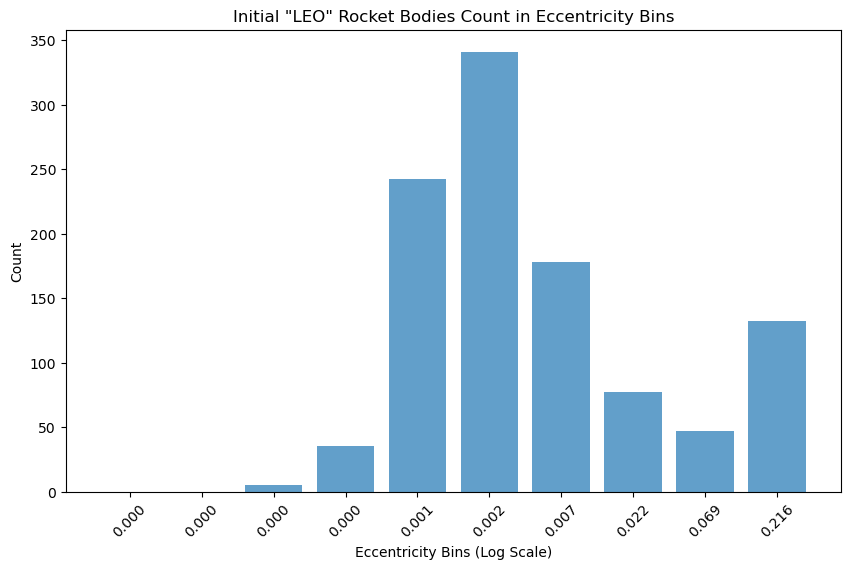

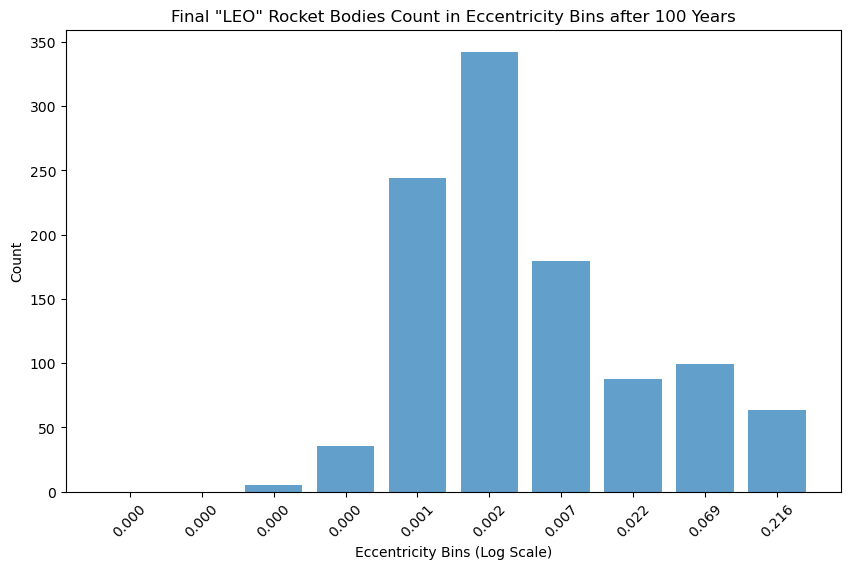

In [80]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

# Assuming x0 is your DataFrame
# x0 = pd.read_csv('path_to_your_csv_file.csv')  # Uncomment this line if you need to load the DataFrame from a CSV file

# Define the non-linear bins
eccentricity_min = x0['ecc'].min()
eccentricity_max = x0['ecc'].max()

# Create non-linear spreads of bins using a logarithmic scale
eccentricity_bins = np.logspace(np.log10(eccentricity_min + 1e-10), np.log10(eccentricity_max), num=100)  # Adding a small value to avoid log(0)
n_e_bins = len(eccentricity_bins) - 1

# Filter the DataFrame for species_class 'B'
rocket_body_data = x0[x0['species_class'] == 'B']

# Debug: Check filtered data
print("Filtered Rocket Body Data:")
print(rocket_body_data[['sma', 'ecc']].head())

# Create the histogram for eccentricity with non-linear bins
plt.figure(figsize=(10, 6))
plt.hist(rocket_body_data['ecc'], bins=eccentricity_bins, edgecolor='black', alpha=0.7)
plt.xscale('log')
plt.xlabel('Eccentricity')
plt.ylabel('Frequency')
plt.title('Histogram of Eccentricity for Rocket Bodies (Log Scale)')
plt.grid(True)
plt.show()

def find_bin_index(bin_edges, value):
    """Find the index of the bin a value belongs to."""
    for i in range(len(bin_edges) - 1):
        if bin_edges[i] <= value < bin_edges[i + 1]:
            return i
    return len(bin_edges) - 2 if value == bin_edges[-1] else -1  # Handle edge case

# Bin the data
rocket_body_data['e_bin'] = rocket_body_data['ecc'].apply(lambda ecc: find_bin_index(eccentricity_bins, ecc))

# Debug: Check binned data
print("Binned Rocket Body Data:")
print(rocket_body_data[['ecc', 'e_bin']].head())

# Additional debug to check the range of values
print("Eccentricity bins:", eccentricity_bins)
print("Rocket Body Eccentricity Range:", rocket_body_data['ecc'].min(), rocket_body_data['ecc'].max())

# Initialize the matrix with zeroes
rocket_body_matrix = pd.DataFrame(0, index=range(n_e_bins), columns=["Count"])

# Populate the matrix
for idx, row in rocket_body_data.iterrows():
    e_idx = row['e_bin']
    if e_idx != -1:
        rocket_body_matrix.at[e_idx, 'Count'] += 1

# Debug: Check the populated matrix
print("Rocket Body Matrix:")
print(rocket_body_matrix)

# Plot the heatmap
plt.figure(figsize=(12, 10))
sns.heatmap(rocket_body_matrix.T, annot=True, fmt="g", cmap="YlGnBu", 
            xticklabels=[f"{ecc:.3f}" for ecc in eccentricity_bins[:-1]])
plt.xlabel('Eccentricity Bins (Log Scale)')
plt.ylabel('Count')
plt.title('"LEO" Rocket Bodies Count in Eccentricity Bins')
plt.xticks(rotation=45)
plt.show()

# Propagation function
def propagate_eccentricity(population, param, time_step):
    new_population = np.zeros_like(population)
    for j, e in enumerate(eccentricity_midpoints):
        if population[j] > 0:
            input_oe = np.array([[7000, e, np.deg2rad(30), np.deg2rad(40), np.deg2rad(60), np.deg2rad(0)]])
            param['t'] = param['t_0'] + time_step
            out_oe, errors = analytic_prop_vec_MOD(input_oe, param)
            if not errors[0]:
                new_e = out_oe[0, 1]
                
                # Calculate fractional movement
                e_fraction = (new_e - e) / (eccentricity_bins[1] - eccentricity_bins[0])
                
                e_bin = np.digitize(new_e, eccentricity_bins) - 1

                # Ensure the bin index is within range
                e_bin = np.clip(e_bin, 0, n_e_bins - 1)

                # Move fraction of objects based on the change in eccentricity
                if e_fraction < 0:
                    if e_bin > 0:
                        new_population[e_bin] += population[j] * (1 + e_fraction)
                        new_population[e_bin - 1] += population[j] * -e_fraction
                    else:
                        new_population[e_bin] += population[j]
                else:
                    if e_bin < n_e_bins - 1:
                        new_population[e_bin] += population[j] * (1 - e_fraction)
                        new_population[e_bin + 1] += population[j] * e_fraction
                    else:
                        new_population[e_bin] += population[j]

                print(f"Moved {population[j]} objects from bin ({j}) to ({e_bin})")
                print(f"Original e: {e:.5f}, New e: {new_e:.5f}, Fraction: {e_fraction:.5f}")
    return new_population

# Parameters
param = {
    'req': 6378.136,  # Earth's radius in km
    'j2': 1.08263e-3,  # J2 perturbation term
    'mu': 398600,  # Gravitational parameter in km^3/s^2
    'rho': 1e-12,  # Example density in kg/km^3
    'Bstar': 2e-4,  # Example Bstar value
    't_0': 0  # Initial time
}

# Time span
years = 1000
days_per_year = 365.25
time_steps_per_year = 12  # Monthly time steps
total_time_steps = int(years * time_steps_per_year)
time_step = days_per_year / time_steps_per_year * 24 * 3600  # seconds

# Calculate midpoints for bins
eccentricity_midpoints = (eccentricity_bins[:-1] + eccentricity_bins[1:]) / 2

# Initialize population array based on initial data distribution
population = np.zeros(n_e_bins)
for idx, row in rocket_body_data.iterrows():
    e_bin = np.digitize(row['ecc'], eccentricity_bins) - 1
    population[e_bin] += 1

# Save initial population for comparison
initial_population = population.copy()

# Propagate orbits over time
for t in range(total_time_steps):
    population = propagate_eccentricity(population, param, time_step)
    print(f"Time step {t + 1}/{total_time_steps}")

# Plot the histogram of initial population
plt.figure(figsize=(10, 6))
plt.bar(range(n_e_bins), initial_population, align='center', alpha=0.7)
plt.xticks(range(n_e_bins), [f"{ecc:.3f}" for ecc in eccentricity_bins[:-1]], rotation=45)
plt.xlabel('Eccentricity Bins (Log Scale)')
plt.ylabel('Count')
plt.title('Initial "LEO" Rocket Bodies Count in Eccentricity Bins')
plt.show()

# Plot the histogram of final population
plt.figure(figsize=(10, 6))
plt.bar(range(n_e_bins), population, align='center', alpha=0.7)
plt.xticks(range(n_e_bins), [f"{ecc:.3f}" for ecc in eccentricity_bins[:-1]], rotation=45)
plt.xlabel('Eccentricity Bins (Log Scale)')
plt.ylabel('Count')
plt.title('Final "LEO" Rocket Bodies Count in Eccentricity Bins after 100 Years')
plt.show()